<a href="https://colab.research.google.com/github/Flixu7/ESP32-Wifi-Scanner/blob/main/VGG16_Food101-tiny_08_90-2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Klasyfikacja 10 dań z zestawu Food-101-tiny za pomocą VGG16


## 1. Importy i funkcje pomocnicze
Importujemy wszystkie niezbędne biblioteki: torch, torchvision do modelu i przetwarzania danych,
matplotlib do wizualizacji, sklearn do macierzy pomyłek, cv2 do Grad-CAM.
`dummy_context_mgr` unifikuje kod z AMP i bez AMP.

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from contextlib import contextmanager
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
from sklearn.metrics import confusion_matrix
import itertools
import kagglehub
from PIL import Image

# 1. Pobieranie zbioru danych i automatyczne wykrywanie katalogów 'train' i 'valid'

In [2]:
path = kagglehub.dataset_download("msarmi9/food101tiny")
print("Path to dataset files:", path)

# Automatyczne szukanie katalogu zawierającego 'train' i 'valid'
found = False
for root, dirs, files in os.walk(path):
    if 'train' in dirs and 'valid' in dirs:
        train_dir = os.path.join(root, 'train')
        val_dir = os.path.join(root, 'valid')
        found = True
        break

assert found, "Nie znaleziono katalogów 'train' i 'valid' w pobranym zbiorze."
print(f'Train dir: {train_dir}\nValid dir: {val_dir}')

100%|██████████| 96.1M/96.1M [00:00<00:00, 151MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/msarmi9/food101tiny/versions/1
Train dir: /root/.cache/kagglehub/datasets/msarmi9/food101tiny/versions/1/data/food-101-tiny/train
Valid dir: /root/.cache/kagglehub/datasets/msarmi9/food101tiny/versions/1/data/food-101-tiny/valid


## 2. Konfiguracja urządzenia i AMP
Sprawdzamy dostępność GPU i włączamy automatyczne mieszanie precyzji (AMP)
dla szybszego i oszczędniejszego treningu.

In [3]:
def dummy_context_mgr():
    """Pusty menedżer kontekstu dla przypadku, gdy AMP jest wyłączone."""
    yield

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
use_amp = torch.cuda.is_available()
scaler = torch.amp.GradScaler() if use_amp else None
print(f"Using device: {device}")

Using device: cuda


## 3. Ścieżki do danych i hiperparametry
Definiujemy batch size, maksymalną liczbę epok, cierpliwość dla wczesnego zatrzymania
oraz rozmiar obrazów 228×228.

In [4]:
batch_size, num_epochs, patience = 32, 30, 3
img_size  = 228

## 4. Transformacje i DataLoadery
Stosujemy silne augmentacje podczas treningu (losowy crop, flip, zmiana barw, erasing),
aby zminimalizować przeuczenie. Walidacja używa tylko resize + center crop,
aby ocena była spójna.

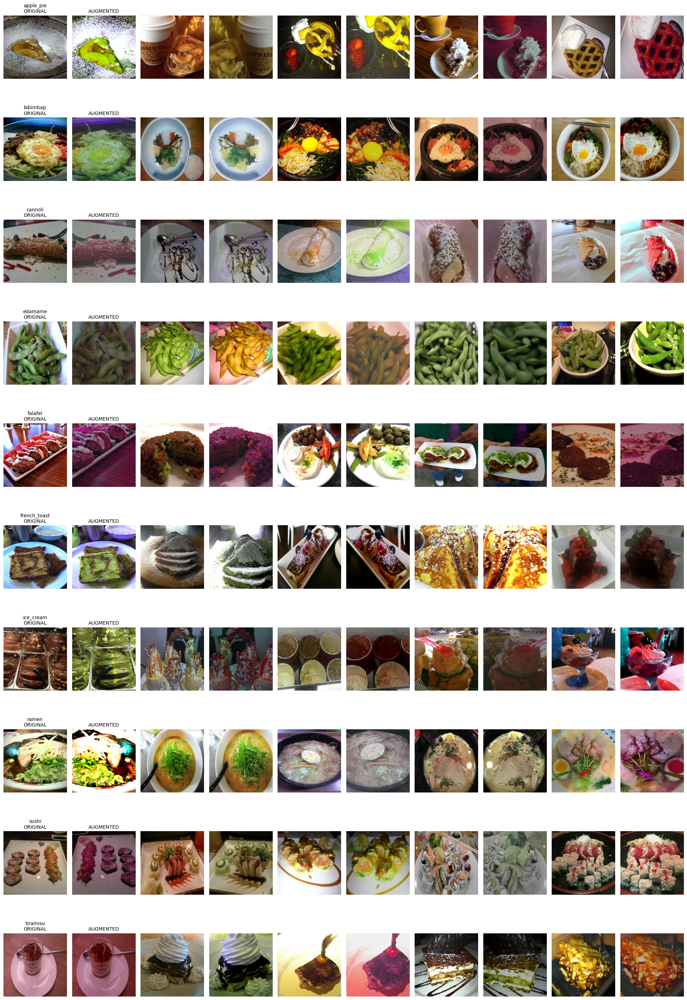

In [5]:
train_t = transforms.Compose([
transforms.RandomResizedCrop(img_size, scale=(0.5, 1.0)),  # losowo przycina i skaluje obraz – zwiększa odporność na różne kadrowania i rozmiary obiektów
transforms.RandomHorizontalFlip(),                        # losowe odbicie w poziomie – uczy model ignorować kierunkowość obiektów (np. lewo/prawo)
transforms.ColorJitter(0.4, 0.4, 0.4, 0.15),               # losowe zmiany jasności, kontrastu, nasycenia i odcienia – zwiększa odporność na różne warunki oświetleniowe
transforms.ToTensor(),                                    # konwersja obrazu do tensora (wymagane przez PyTorch)
transforms.RandomErasing(p=0.5),                           # losowe wymazanie fragmentu obrazu – poprawia odporność na częściowe zasłonięcie obiektu
transforms.Normalize([0.485, 0.456, 0.406],                # normalizacja – przyspiesza i stabilizuje uczenie przez sprowadzenie wartości pikseli do podobnej skali
                     [0.229, 0.224, 0.225]),
])

val_t = transforms.Compose([
    transforms.Resize(int(img_size * 1.14)),
    transforms.CenterCrop(img_size),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])


train_loader = DataLoader(
    datasets.ImageFolder(train_dir, transform=train_t),
    batch_size=batch_size, shuffle=True,  num_workers=2, pin_memory=True
)
val_dataset = datasets.ImageFolder(val_dir, transform=val_t)
val_loader  = DataLoader(
    val_dataset,
    batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True
)
class_names = train_loader.dataset.classes
num_classes = len(class_names)
raw_dataset = datasets.ImageFolder(train_dir, transform=None)
def denormalize(tensor_img):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = tensor_img.numpy().transpose((1, 2, 0))
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

# --- Przygotowanie danych do wizualizacji ---
samples_per_class = {class_name: [] for class_name in class_names}

# Pobieramy max 5 obrazów na klasę
for img, label in raw_dataset:
    class_name = class_names[label]
    if len(samples_per_class[class_name]) < 5:
        samples_per_class[class_name].append(img)
    if all(len(lst) >= 5 for lst in samples_per_class.values()):
        break

# --- Wyświetlanie ---
fig, axes = plt.subplots(num_classes, 10, figsize=(20, 3*num_classes))

for i, class_name in enumerate(class_names):
    for j in range(5):
        original_img = samples_per_class[class_name][j].resize((img_size, img_size))

        # Augmentacja bez Normalizacji i RandomErasing (bo trudno je odwrócić do obrazu)
        # Robimy osobne transformacje do wizualizacji (to samo co w train_t, ale bez ToTensor i Normalize)
        visual_aug = transforms.Compose([
            transforms.RandomResizedCrop(img_size, scale=(0.5, 1.0)),
            transforms.RandomHorizontalFlip(),
            transforms.ColorJitter(0.4, 0.4, 0.4, 0.15),
        ])

        # Zastosuj augmentację (PIL Image -> PIL Image)
        augmented_img = visual_aug(samples_per_class[class_name][j]).resize((img_size, img_size))

        # Pokaż oryginał
        axes[i, j*2].imshow(original_img)
        axes[i, j*2].axis('off')
        if j == 0:
            axes[i, j*2].set_title(f"{class_name}\nORIGINAL", fontsize=10)

        # Pokaż po augmentacji
        axes[i, j*2 + 1].imshow(augmented_img)
        axes[i, j*2 + 1].axis('off')
        if j == 0:
            axes[i, j*2 + 1].set_title("AUGMENTED", fontsize=10)

plt.tight_layout()
plt.show()


## 5. Definicja modelu: zmodyfikowane VGG16
Wybieramy VGG16 z BatchNorm. Zamrażamy wstępne warstwy, odblokowujemy ostatnie 12.
Dodajemy dodatkowy blok Conv-BN-ELU oraz dropout w headzie.

In [3]:
class SimpleVGG16(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        base = models.vgg16_bn(weights=models.VGG16_BN_Weights.IMAGENET1K_V1)
        # zamrażamy większość warstw
        for p in base.features.parameters(): p.requires_grad = False
        for p in base.features[-12:].parameters(): p.requires_grad = True
        self.features   = base.features
        self.extra      = nn.Sequential(
            nn.Conv2d(512,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ELU(inplace=True),
        )
        self.pool       = nn.AdaptiveAvgPool2d((1,1))
        self.classifier = nn.Sequential(
            nn.Linear(256,1024),
            nn.ELU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(1024,num_classes),
        )
    def forward(self, x):
        x = self.features(x)
        x = self.extra(x)
        x = self.pool(x).view(x.size(0), -1)
        return self.classifier(x)

model = SimpleVGG16(num_classes).to(device)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

NameError: name 'nn' is not defined

## 6. MixUp, optymalizator i scheduler
MixUp wzmacnia augmentację przez mieszanie obrazów i etykiet.
Ustawiamy AdamW z różnymi learning rates i ReduceLROnPlateau,
aby adaptować lr do walidacyjnej straty.

In [ ]:
def mixup_data(x, y, alpha=0.2):
    lam = np.random.beta(alpha, alpha)
    idx = torch.randperm(x.size(0)).to(x.device)
    mixed = lam * x + (1 - lam) * x[idx]
    return mixed, y, y[idx], lam

def mixup_criterion(crit, out, ya, yb, lam):
    return lam * crit(out, ya) + (1 - lam) * crit(out, yb)

def make_optimizer():
    return optim.AdamW([
        {'params': model.features[-12:].parameters(), 'lr': 5e-5},
        {'params': model.extra.parameters(),             'lr': 5e-5},
        {'params': model.classifier.parameters(),        'lr': 5e-4},
    ], weight_decay=1e-3)

optimizer = make_optimizer()
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

## 7. Pętla treningowa z wczesnym zatrzymaniem
Trenujemy do 30 epok, monitorujemy stratę walidacyjną,
odblokowujemy wszystkie warstwy od epoki 6 i zatrzymujemy
wcześniej, jeśli strata nie spada przez 5 epok.

In [ ]:
train_losses, val_losses = [], []
train_accs,   val_accs   = [], []

for epoch in range(1, num_epochs+1):
    model.train()
    running_loss = running_correct = total = 0
    for x, y in tqdm(train_loader, desc=f"Train {epoch:02d}"):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        xm, ya, yb, lam = mixup_data(x, y)
        with torch.amp.autocast(device_type='cuda') if use_amp else dummy_context_mgr():
            out  = model(xm)
            loss = mixup_criterion(criterion, out, ya, yb, lam)
        if use_amp:
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            loss.backward()
            optimizer.step()
        preds = out.argmax(1)
        running_loss    += loss.item() * x.size(0)
        # tu train_acc będzie liczone na oryginalnych etykietach – pamiętaj, że mixup zaniża!
        running_correct += preds.eq(y).sum().item()
        total           += y.size(0)
    train_losses.append(running_loss/total)
    train_accs.append(running_correct/total)

    # walidacja
    model.eval()
    vloss = vcorrect = vtotal = 0
    with torch.no_grad():
        for x, y in val_loader:
            x, y    = x.to(device), y.to(device)
            out     = model(x)
            loss    = criterion(out, y)
            vloss  += loss.item() * x.size(0)
            vcorrect += out.argmax(1).eq(y).sum().item()
            vtotal   += y.size(0)
    val_losses.append(vloss/vtotal)
    val_accs.append(vcorrect/vtotal)

    scheduler.step(vloss/vtotal)
    print(f"Epoch {epoch:02d}: Train loss {train_losses[-1]:.4f}, acc {train_accs[-1]*100:.1f}% | "
          f"Val loss {val_losses[-1]:.4f}, acc {val_accs[-1]*100:.1f}%")

    # odblokuj wszystkie warstwy od epoki 6
    if epoch == 6:
        for p in model.features.parameters():
            p.requires_grad = True
        optimizer = make_optimizer()
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

    # early stopping
    if len(val_losses) > patience and val_losses[-patience-1] <= min(val_losses[-patience:]):
        print(f"⏹ Early stopping at epoch {epoch}")
        break

# zapisz najlepszy model
torch.save(model.state_dict(), 'best.pth')
print("Training complete. Best val loss:", min(val_losses))

Train 01: 100%|██████████| 47/47 [00:20<00:00,  2.32it/s]


Epoch 01: Train loss 1.1255, acc 55.9% | Val loss 0.8396, acc 87.8%


Train 02: 100%|██████████| 47/47 [00:20<00:00,  2.31it/s]


Epoch 02: Train loss 1.0976, acc 45.5% | Val loss 0.8210, acc 88.4%


Train 03: 100%|██████████| 47/47 [00:20<00:00,  2.30it/s]


Epoch 03: Train loss 1.1120, acc 63.7% | Val loss 0.8379, acc 88.4%


Train 04: 100%|██████████| 47/47 [00:20<00:00,  2.32it/s]


Epoch 04: Train loss 1.0149, acc 53.3% | Val loss 0.8216, acc 88.8%


Train 05: 100%|██████████| 47/47 [00:19<00:00,  2.45it/s]


Epoch 05: Train loss 1.0618, acc 64.5% | Val loss 0.8211, acc 89.4%
⏹ Early stopping at epoch 5
Training complete. Best val loss: 0.8210112729072571


## 8. Wykresy strat i dokładności
Wizualizujemy krzywe strat i dokładności, by ocenić konwergencję
i ewentualne przeuczenie.

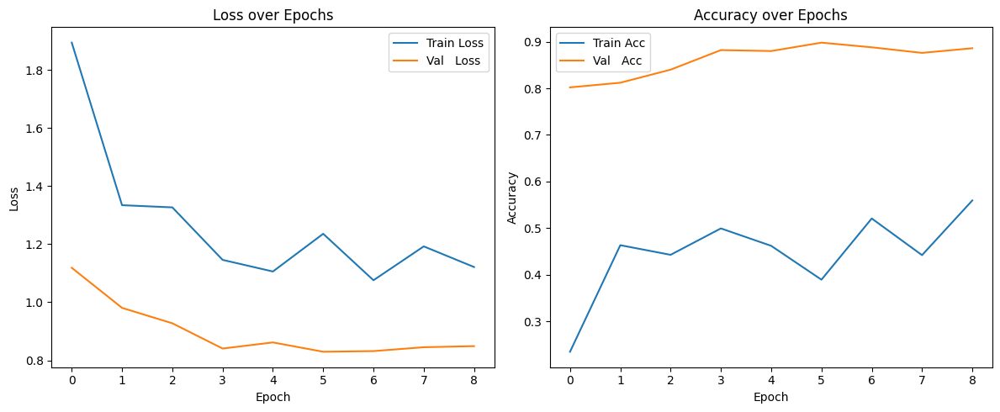

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses,   label='Val   Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(train_accs, label='Train Acc')
plt.plot(val_accs,   label='Val   Acc')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## 9. Macierz pomyłek (Confusion Matrix)
Sprawdzamy, które klasy model myli najczęściej, co może wskazać
na potrzebę dodatkowych augmentacji lub fine-tuningu.

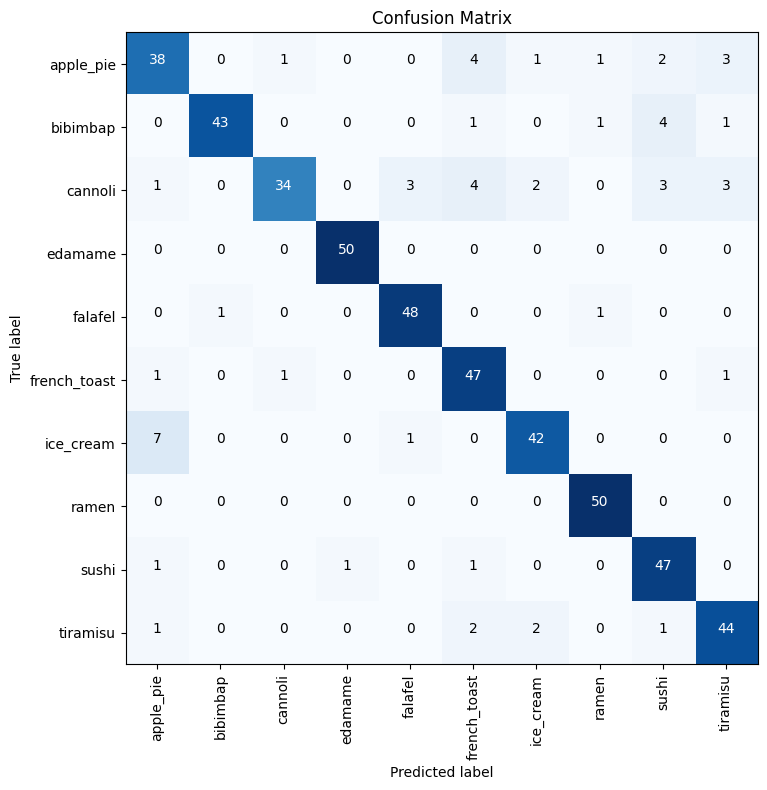

In [ ]:
model.load_state_dict(torch.load('best.pth'))
all_preds, all_labels = [], []
model.eval()
with torch.no_grad():
    for x,y in val_loader:
        x = x.to(device)
        out = model(x)
        all_preds .extend(out.argmax(1).cpu().tolist())
        all_labels.extend(y.tolist())

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(10,8))
plt.imshow(cm, cmap=plt.cm.Blues)
thresh = cm.max() / 2.
for i,j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i,j],
             ha='center',
             color='white' if cm[i,j] > thresh else 'black')
plt.xticks(range(num_classes), class_names, rotation=90)
plt.yticks(range(num_classes), class_names)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

## 10. 5 przykładów prawidłowo i błędnie sklasyfikowanych

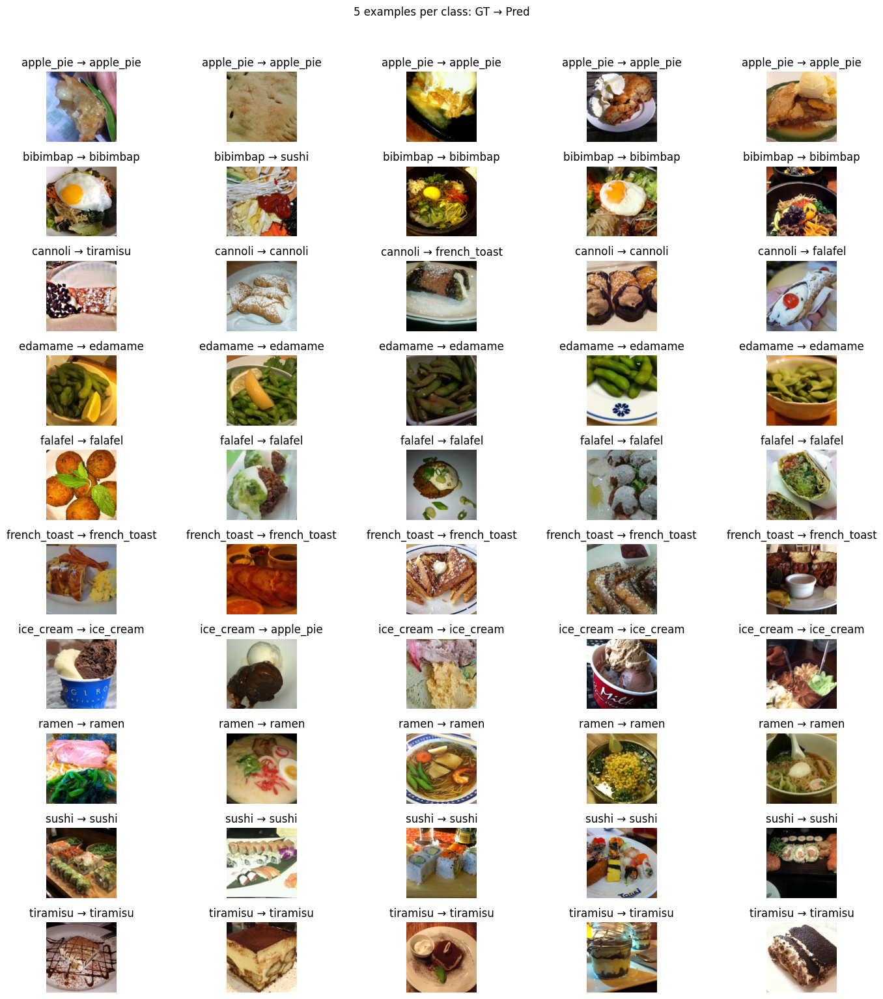

In [ ]:
# Przygotowanie indeksów
indices_per_class = {i: [] for i in range(num_classes)}
for idx, (_, lbl) in enumerate(val_dataset.samples):
    if len(indices_per_class[lbl]) < 5:
        indices_per_class[lbl].append(idx)
    if all(len(v) == 5 for v in indices_per_class.values()):
        break

mean = np.array([0.485,0.456,0.406])
std  = np.array([0.229,0.224,0.225])
def denorm(t): return np.clip(t.cpu().permute(1,2,0).numpy()*std + mean, 0, 1)

plt.figure(figsize=(15, num_classes*1.5))
row = 0
for lbl, idxs in indices_per_class.items():
    for col, idx in enumerate(idxs):
        img, _ = val_dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).argmax(1).item()
        plt.subplot(num_classes, 5, row*5 + col + 1)
        plt.imshow(denorm(img))
        plt.title(f"{class_names[lbl]} → {class_names[pred]}")
        plt.axis('off')
    row += 1
plt.suptitle('5 examples per class: GT → Pred', y=1.02)
plt.tight_layout()
plt.show()

## 11. Grad-CAM: wizualizacja obszarów decyzyjnych
Implementujemy Grad-CAM, aby zobaczyć, na których częściach obrazu
model bazuje przy predykcji.

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


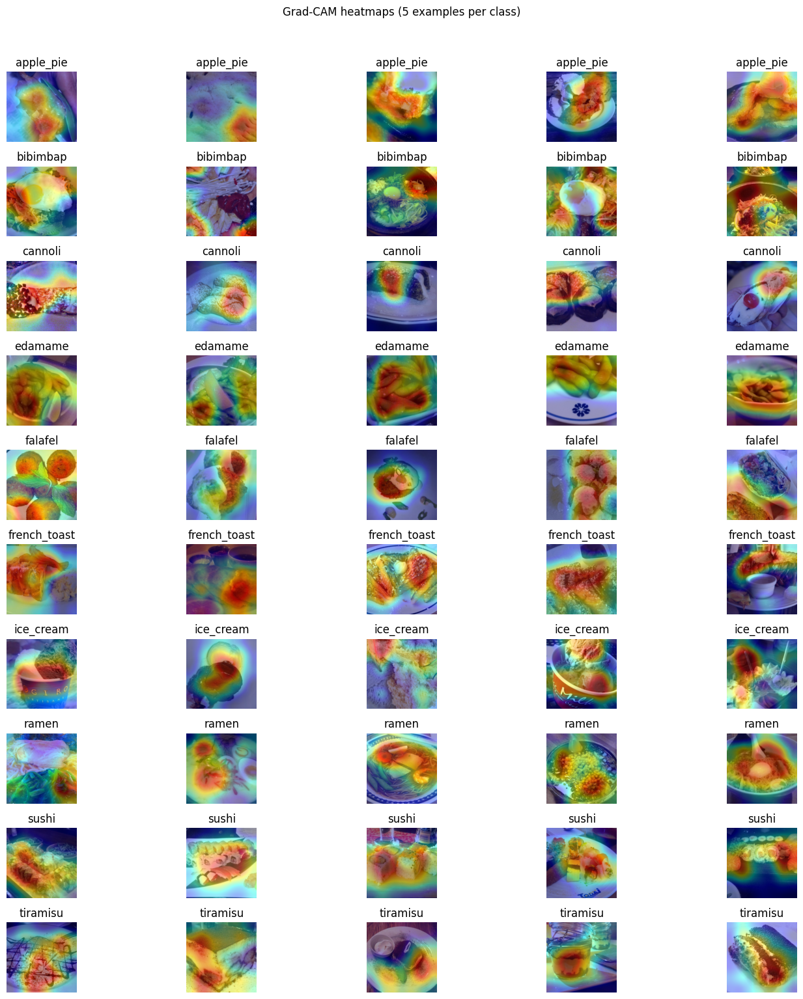

In [ ]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.handles = []
        self._register_hooks()

    def _register_hooks(self):
        def fwd(module, inp, out):
            self.activations = out.detach()
        def bwd(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()
        self.handles.append(self.target_layer.register_forward_hook(fwd))
        self.handles.append(self.target_layer.register_backward_hook(bwd))

    def generate_cam(self, x, cls):
        self.model.zero_grad()
        out = self.model(x)
        loss = out[0, cls]
        loss.backward()

        # oblicz średnie gradienty
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        # wygeneruj mapę aktywacji
        cam = (weights * self.activations).sum(dim=1, keepdim=True).relu()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam.squeeze().cpu().numpy()

    def clear(self):
        for h in self.handles:
            h.remove()
        self.handles.clear()

def apply_cam(img, mask):
    H, W = img.shape[1], img.shape[2]
    mask_resized = cv2.resize(mask, (W, H), interpolation=cv2.INTER_CUBIC)
    mask_resized = np.clip(mask_resized, 0, 1)
    heat = cv2.applyColorMap((mask_resized * 255).astype('uint8'), cv2.COLORMAP_JET)
    heat = cv2.cvtColor(heat, cv2.COLOR_BGR2RGB) / 255.0
    base = img.cpu().permute(1, 2, 0).numpy() * std + mean
    return np.clip(0.6 * base + 0.4 * heat, 0, 1)


grad = GradCAM(model, model.extra[-1])
plt.figure(figsize=(15, num_classes*1.5))
row = 0
for lbl, idxs in indices_per_class.items():
    for col, idx in enumerate(idxs):
        img, _ = val_dataset[idx]
        mask    = grad.generate_cam(img.unsqueeze(0).to(device), lbl)
        cam_img = apply_cam(img, mask)
        plt.subplot(num_classes, 5, row*5 + col + 1)
        plt.imshow(cam_img)
        plt.title(class_names[lbl])
        plt.axis('off')
    row += 1
plt.suptitle('Grad-CAM heatmaps (5 examples per class)', y=1.02)
plt.tight_layout()
plt.show()
grad.clear()

# Wpływ modyfikacji na jakość modelu

## 1. Brak augmentacji i mixupu  
- **Val Acc 85%, Val Loss 0.90 już po 1. epokach** – szybkie dopasowanie do danych walidacyjnych.  
- **Train Acc → 100%** od kolejnych epok – klasyczny objaw przeuczenia (overfitting).

## 2. Tylko augmentacja (bez mixupu)  
- Start: **Train Loss 1.0, Train Acc 81%** → koniec: **Val Acc ~88%**.  
- Augmentacja spowalnia dopasowanie, ale podnosi odporność modelu.  
- Wciąż jednak **Train Acc rośnie szybciej niż Val Acc**, co sugeruje utrzymanie overfittingu.

## 3. Tylko mixup (bez augmentacji)  
- Start: **Train Loss 0.97, Train Acc 86%** → koniec: **Val Acc ~89%**.  
- Mixup wygładza etykiety i stabilizuje trening.  
- Efekt przeuczenia jest łagodniejszy niż przy czystym treningu.

## 4. Pełne odblokowanie VGG16 + niższy LR + augmentacja + mixup  
- **Train/Val Loss: 1.10/0.79 → 0.84/0.88**  
- Brak wczesnego zatrzymania (early stopping) – model poprawia się lub stabilizuje zamiast gwałtownie przeuczać.  
- Kombinacja augmentacji i mixupu z fine‑tuningiem całej sieci daje najlepszy kompromis między konwergencją a generalizacją.

## 5. Wpływ dropout w headzie  
- **Bez dropout**: Val Acc spada do **87%**.  
- Dropout wprowadza istotną regularizację i przeciwdziała zapamiętywaniu szumów.

## 6. Zastąpienie VGG16 wariantem VGG7  
- VGG7 osiąga **Train/Val Acc ~85/88%**.  
- Mniejsza liczba parametrów ogranicza overfitting przy zachowaniu jakości.

## 7. Mocniejsza augmentacja  
- Val Loss obniża się do **~0.85**, ale Val Acc stabilizuje się w okolicach **88%**.  
- Nadmiar transformacji przestaje przynosić dalsze korzyści.

---

# Podsumowanie  
- **Augmentacja + mixup** – komplementarne techniki: wzbogacają dane i wygładzają granice decyzyjne.  
- **Fine‑tuning wszystkich warstw** z obniżonym LR – pełne wykorzystanie pretrenowanych cech bez ich „wybicia”.  
- **Dropout** i **lżejsze warianty sieci** – skuteczne regularizatory.  
- Zbyt silna augmentacja – rośnie złożoność treningu bez znaczącego wzrostu dokładności.  


# Czy model się przeucza? Jak to sprawdzić

## 1. Porównanie metryk treningowych i walidacyjnych  
- **Train Acc ≤ 62%, Val Acc ≈ 90%**  
- **Train Loss ≥ 0.90, Val Loss ≤ 0.79**  

Jeżeli model się przeucza, to zazwyczaj:
- **Train Acc ≫ Val Acc**  
- **Train Loss ≪ Val Loss**  

Tutaj jest odwrotnie – walidacja wypada lepiej niż trening, więc **brak typowego overfittingu**.

## 2. Analiza krzywych (Loss over Epochs / Accuracy over Epochs)  
- Krzywe **train/val loss** zbieżne, bez gwałtownego rozsuwania się.  
- Krzywe **train/val accuracy** nie wykazują rosnącej luki (val > train oznacza, że regularizacja / mixup ograniczają przeuczenie).  

## 3. Sprawdzenie za pomocą wykresów  
1. Jeśli **po pewnym punkcie** training loss nadal spada, a val loss rośnie → overfitting.  
2. Jeśli training accuracy rośnie do 100%, a val accuracy spada → overfitting.  
3. W Tym wypadku **val_loss stabilnie maleje** obok train_loss i **val_acc stabilnie rośnie** powyżej train_acc → brak przeuczenia.

## 4. Wnioski  
- Model **nie przeucza się**